<div style="text-align:center">
    <img src="https://upload.wikimedia.org/wikipedia/commons/b/b0/Logo_Universidad_Polit%C3%A9cnica_Salesiana_del_Ecuador.png" alt="UPS">
    <h1>Practica PyCuda</h1>
    <h2>Nombre: Leonardo Crespo, Carlos Saico</h2>
</div>


# 1. Modulos e Importaciones

In [3]:
import time
import matplotlib.pyplot as plt
import matplotlib 
import matplotlib.image as mpimg
import numpy as np
import pycuda.autoinit
from pycuda import gpuarray
from pycuda.elementwise import ElementwiseKernel
from PIL import Image
import requests
from io import BytesIO
import pycuda.autoinit
import pycuda.driver as drv
import numpy as np
from pycuda.compiler import SourceModule

# 2. Visualización de la imagen 

<p>En esta sección colocamos la URL de la imagen que se desea aplicar los filtros, podemos cargarla tanto como url, asi como utilizando path.</p>

In [4]:
# Leer imagen desde URL
url = "https://concepto.de/wp-content/uploads/2015/03/paisaje-e1549600034372.jpg"
respuesta = requests.get(url)
img_url = Image.open(BytesIO(respuesta.content))

# Leer imagen desde un archivo local
ruta_archivo = "/ruta/a/tu/imagen.jpg"
img_archivo = Image.open(ruta_archivo)


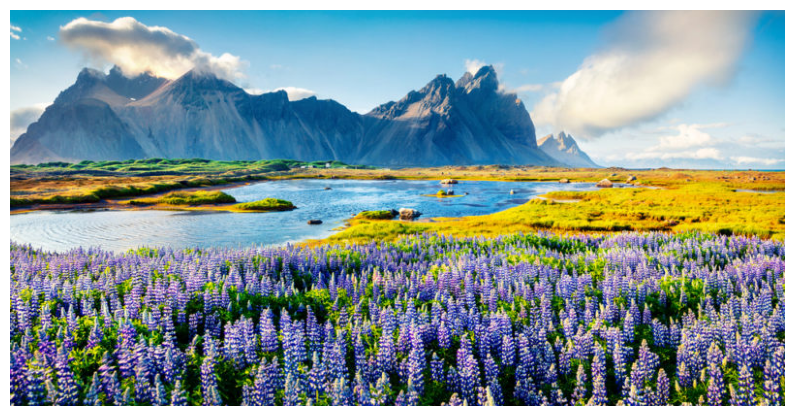

In [3]:
# Mostrar imagen desde URL
plt.figure(figsize=(10,10))
plt.imshow(img_url)
plt.axis('off')  # no mostrar los ejes
plt.show()

# Mostrar imagen desde un archivo local
#plt.figure(figsize=(10,10))
#plt.imshow(img_archivo)
#plt.axis('off')  # no mostrar los ejes
#plt.show()


## 2.1. Guarda la imagen

In [41]:
imagen_np = np.array(img_url)
imagen_original_guardar = Image.fromarray(imagen_np.astype(np.uint8))
imagen_original_guardar.save("imagen_original.jpg")
print("Imagen original guardada.")

Imagen original guardada.


# 3. Aplicación de Filtros

## 3.1. Filtro de Gauss

1. **Inicialización del filtro:** Se crea una matriz cuadrada de tamaño tamaño x tamaño llena de ceros. Esta matriz representa el filtro Gaussiano.

2. **Cálculo de los valores del filtro:** Se itera sobre cada celda de la matriz y se calcula su valor utilizando la fórmula de la función Gaussiana bidimensional:

                            $$ f(x, y) = \frac{1}{2 \pi \sigma^2} e^{-\frac{x^2 + y^2}{2 \sigma^2}} $$

3. **Normalización del filtro:** Para asegurar que la aplicación del filtro no cambie el brillo general de la imagen, se normalizan los valores del filtro de manera que su suma sea 1. Esto se logra dividiendo cada valor del filtro por la suma de todos los valores del filtro.

In [4]:
def filtro_gaussiano(tamaño, sigma):
    filtro = [[0 for _ in range(tamaño)] for _ in range(tamaño)]
    suma = 0
    medio = tamaño // 2

    for x in range(-medio, medio+1):
        for y in range(-medio, medio+1):
            valor = (1 / (2 * 3.1416 * sigma**2)) * 2.71828**(-(x**2 + y**2) / (2 * sigma**2))
            filtro[x+medio][y+medio] = valor
            suma += valor

    # Normalizar el filtro
    for i in range(tamaño):
        for j in range(tamaño):
            filtro[i][j] /= suma

    return filtro


La función `aplicar_filtro` toma como entrada una imagen y un filtro, y devuelve una nueva imagen que es el resultado de aplicar el filtro a la imagen original.

La función se puede describir con los siguientes pasos:

1. **Inicialización de la nueva imagen**: Se crea una matriz de ceros del mismo tamaño y número de canales que la imagen original. Esta matriz representa la nueva imagen a la que se aplicará el filtro.

2. **Aplicación del filtro**: Se itera sobre cada píxel de la imagen original (excepto los bordes, para evitar problemas de índices fuera de rango), y se calcula el nuevo valor de cada píxel como la suma ponderada de los píxeles vecinos, donde los pesos son los valores del filtro. La fórmula para calcular el nuevo valor del píxel es:

    $$ \text{suma} = \sum_{x=-\text{medio}}^{\text{medio}} \sum_{y=-\text{medio}}^{\text{medio}} \text{pixel}[i+x][j+y] \times \text{filtro}[x+\text{medio}][y+\text{medio}] $$

    Donde `pixel[i+x][j+y]` es el valor del píxel vecino y `filtro[x+medio][y+medio]` es el valor correspondiente del filtro.

3. **Asignación del nuevo valor del píxel**: El nuevo valor del píxel se redondea al entero más cercano y se convierte al tipo de datos `np.uint8` para asegurar que sigue siendo un valor válido para un píxel de imagen. Luego, este valor se asigna al píxel correspondiente en la nueva imagen.




In [5]:
def aplicar_filtro(imagen, filtro):
    alto, ancho, canales = imagen.shape
    tamaño = len(filtro)
    medio = tamaño // 2
    nueva_imagen = np.zeros((alto, ancho, canales), dtype=np.uint8)

    for i in range(medio, alto-medio):
        for j in range(medio, ancho-medio):
            suma = np.zeros(canales, dtype=np.float64)
            for x in range(-medio, medio+1):
                for y in range(-medio, medio+1):
                    pixel = imagen[i+x][j+y]
                    valor = filtro[x+medio][y+medio]
                    suma += pixel * valor
            nueva_imagen[i][j] = np.round(suma).astype(np.uint8)

    return nueva_imagen

### Resultados

El tiempo de ejecución GAUSS CPU 9x9 es: 51.17216372489929 segundos
El tiempo de ejecución GAUSS CPU 13x13 es: 105.58489155769348 segundos
El tiempo de ejecución GAUSS CPU 21x21 es: 262.29653334617615 segundos


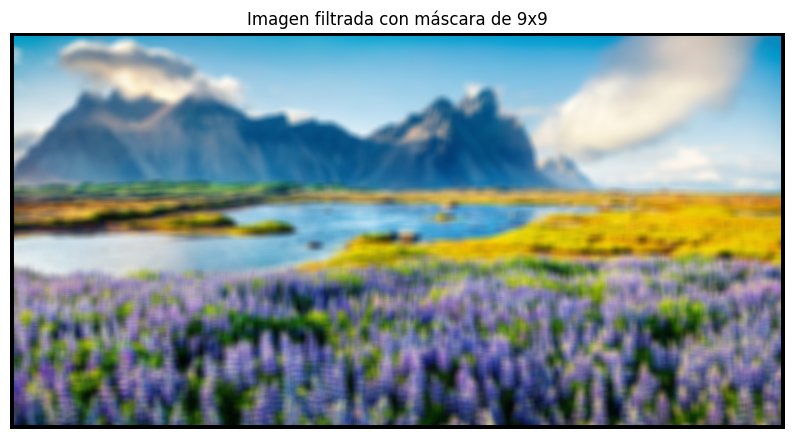

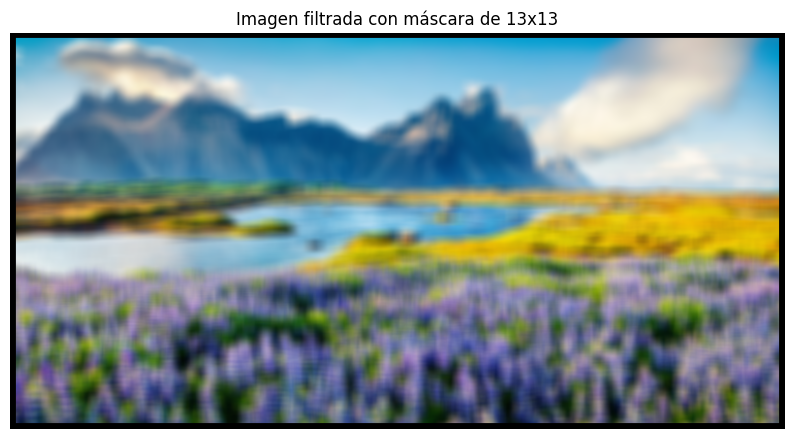

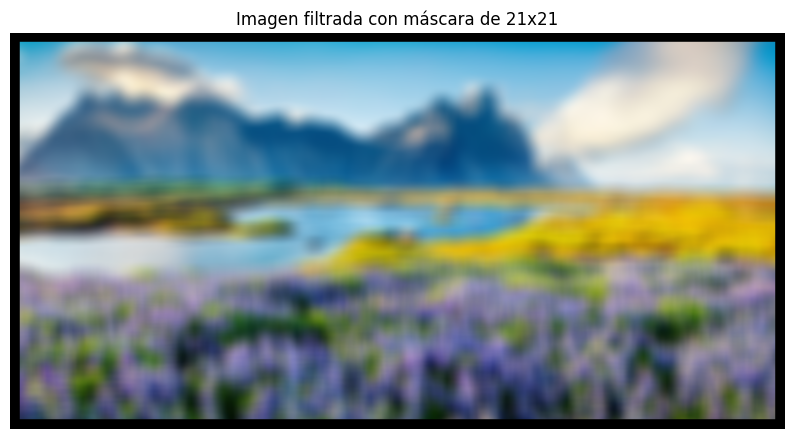

In [6]:
# Definir los tamaños de las máscaras
tamaños_máscara = [9, 13, 21]
# Convertir la imagen a una matriz NumPy
imagen_np = np.array(img_url)
# Aplicar el filtro de Gauss con cada tamaño de máscara
for tamaño in tamaños_máscara:
    # Crear el filtro de Gauss
    start_time = time.time()  # Iniciar el cronómetro antes de la operación
    filtro = filtro_gaussiano(tamaño, 8)  # Puedes ajustar sigma a tus necesidades
    # Aplicar el filtro a la imagen
    imagen_filtrada = aplicar_filtro(imagen_np, filtro)
    end_time = time.time()  # Detener el cronómetro después de la operación
    tiempo_ejecucion = end_time - start_time  # Calcular el tiempo de ejecución
    
    print(f"El tiempo de ejecución GAUSS CPU {tamaño}x{tamaño} es: {tiempo_ejecucion} segundos")
    
    # Mostrar la imagen filtrada
    plt.figure(figsize=(10,10))
    plt.imshow(imagen_filtrada, cmap='gray')
    plt.title(f'Imagen filtrada con máscara de {tamaño}x{tamaño}')
    plt.axis('off')  # no mostrar los ejes
    
plt.show()


### 3.1.1 Guarda la imagen

In [40]:
# Convertir la imagen a una matriz NumPy
imagen_np = np.array(img_url)
# Definir los tamaños de las máscaras
tamaños_máscara = [9, 13, 21]
# Aplicar el filtro de Gauss con cada tamaño de máscara
for tamaño in tamaños_máscara:
    # Crear el filtro de Gauss
    filtro = filtro_gaussiano(tamaño, 8)  # Puedes ajustar sigma a tus necesidades
    # Aplicar el filtro a la imagen
    imagen_filtrada = aplicar_filtro(imagen_np, filtro)
    # Guardar la imagen filtrada
    imagen_guardar = Image.fromarray(imagen_filtrada.astype(np.uint8))
    imagen_guardar.save(f"imagen_filtrada_GAUSS_CPU{tamaño}x{tamaño}.jpg")
    print(f"Imagen filtrada de tamaño {tamaño}x{tamaño} guardada.")
print("Todas las imágenes han sido guardadas.")

Imagen filtrada de tamaño 9x9 guardada.
Imagen filtrada de tamaño 13x13 guardada.
Imagen filtrada de tamaño 21x21 guardada.
Todas las imágenes han sido guardadas.


## 3.2. Filtro Sal y Pimienta

La función `ruido_sal_pimienta` toma como entrada una imagen y una probabilidad, y devuelve una nueva imagen que es el resultado de añadir ruido de "sal y pimienta" a la imagen original.

La función se puede describir con los siguientes pasos:

1. **Copia de la imagen original**: Se crea una copia de la imagen original para no modificarla.

2. **Cálculo del número de píxeles afectados por el ruido**: Se calcula el número de píxeles que serán afectados por el ruido. Este número es igual a la probabilidad `prob` multiplicada por el número total de píxeles en la imagen.

3. **Adición de ruido de sal**: Se seleccionan aleatoriamente `num_píxeles` píxeles de la imagen y se les asigna el valor máximo de un píxel (255), lo que se conoce como ruido de "sal".

4. **Adición de ruido de pimienta**: Se seleccionan aleatoriamente `num_píxeles` píxeles de la imagen y se les asigna el valor mínimo de un píxel (0), lo que se conoce como ruido de "pimienta".




In [8]:
def ruido_sal_pimienta(imagen, prob):
    # Copiar la imagen para no modificar la original
    imagen_sp = np.copy(imagen)

    # Obtener el número de píxeles afectados por el ruido
    num_píxeles = int(prob * imagen.size)

    # Añadir ruido de sal
    coords = tuple(np.random.randint(0, i - 1, num_píxeles) for i in imagen.shape)
    imagen_sp[coords] = 255

    # Añadir ruido de pimienta
    coords = tuple(np.random.randint(0, i - 1, num_píxeles) for i in imagen.shape)
    imagen_sp[coords] = 0

    return imagen_sp


La función `ruido_sal_pimienta_region` toma como entrada una imagen, una probabilidad y un tamaño de región, y devuelve una nueva imagen que es el resultado de añadir ruido de "sal y pimienta" a regiones específicas de la imagen original.

La función se puede describir con los siguientes pasos:

1. **Obtención de las dimensiones de la imagen**: Se obtienen las dimensiones de la imagen original (alto, ancho y número de canales).

2. **Copia de la imagen original**: Se crea una copia de la imagen original para no modificarla.

3. **División de la imagen en regiones y aplicación del ruido**: Se divide la imagen en regiones de tamaño `tamaño_region x tamaño_region` y se aplica el ruido de "sal y pimienta" a cada región. Para cada región, se realiza lo siguiente:

    - **Obtención de la región actual**: Se obtiene la región actual de la imagen original.

    - **Aplicación del ruido de sal y pimienta a la región**: Se aplica el ruido de "sal y pimienta" a la región utilizando la función `ruido_sal_pimienta`.

    - **Guardado de la región ruidosa en la imagen**: Se guarda la región ruidosa en la misma posición en la nueva imagen.




In [9]:
def ruido_sal_pimienta_region(imagen, prob, tamaño_region):
    # Obtener las dimensiones de la imagen
    alto, ancho, _ = imagen.shape

    # Crear una copia de la imagen para no modificar la original
    imagen_sp = np.copy(imagen)

    # Dividir la imagen en regiones y aplicar el ruido a cada región
    for i in range(0, alto, tamaño_region):
        for j in range(0, ancho, tamaño_region):
            # Obtener la región actual
            region = imagen[i:i+tamaño_region, j:j+tamaño_region]

            # Aplicar el ruido de sal y pimienta a la región
            region_sp = ruido_sal_pimienta(region, prob)

            # Guardar la región ruidosa en la imagen
            imagen_sp[i:i+tamaño_region, j:j+tamaño_region] = region_sp

    return imagen_sp


### Resultados

El tiempo de ejecución para una región de tamaño usando CPU 9x9 es: 0.2408766746520996 segundos
El tiempo de ejecución para una región de tamaño usando CPU 13x13 es: 0.1304159164428711 segundos
El tiempo de ejecución para una región de tamaño usando CPU 21x21 es: 0.07002115249633789 segundos


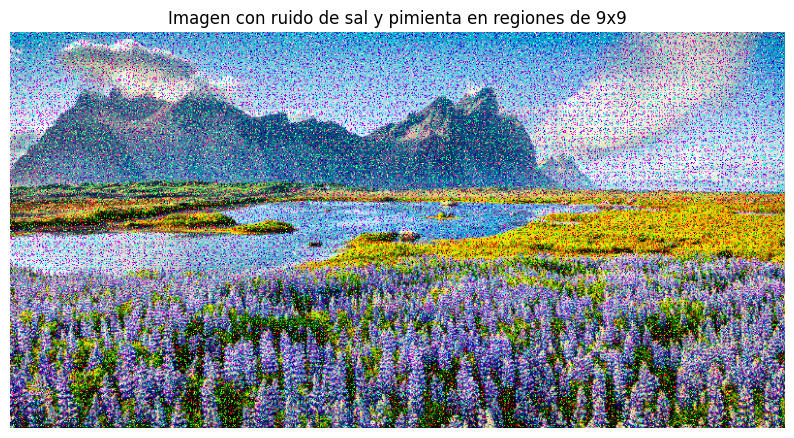

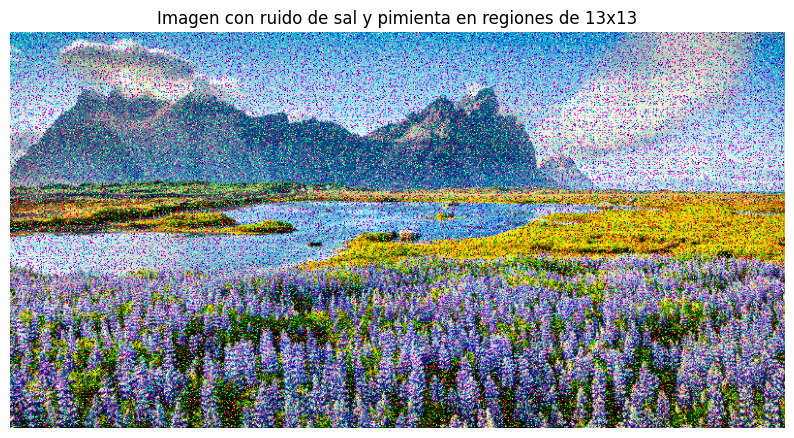

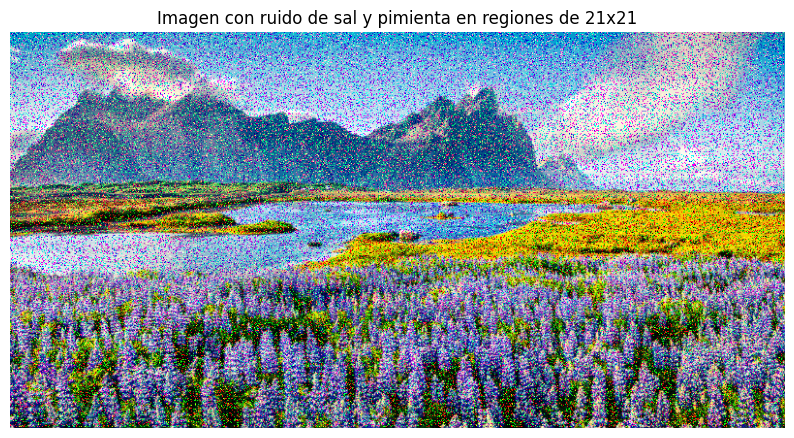

In [10]:
# Asumiendo que 'imagen' es tu imagen cargada desde la URL
tamaños_región = [9, 13, 21]  # Puedes ajustar los tamaños de las regiones a tus necesidades
prob = 0.1  # Puedes ajustar la probabilidad a tus necesidades

for tamaño in tamaños_región:
    start_time = time.time()  # Iniciar el cronómetro antes de la operación
    imagen_ruidosa = ruido_sal_pimienta_region(imagen_np, prob, tamaño)
    end_time = time.time()  # Detener el cronómetro después de la operación
    tiempo_ejecucion = end_time - start_time  # Calcular el tiempo de ejecución
    
    print(f"El tiempo de ejecución para una región de tamaño usando CPU {tamaño}x{tamaño} es: {tiempo_ejecucion} segundos")
    # Mostrar la imagen ruidosa
    plt.figure(figsize=(10,10))
    plt.imshow(imagen_ruidosa, cmap='gray')
    plt.title(f'Imagen con ruido de sal y pimienta en regiones de {tamaño}x{tamaño}')
    plt.axis('off')  # no mostrar los ejes
    
plt.show()


### 3.2.1 Guarda la imagen

In [46]:
tamaños_región = [9, 13, 21]  # Puedes ajustar los tamaños de las regiones a tus necesidades
prob = 0.1  # Puedes ajustar la probabilidad a tus necesidades

for tamaño in tamaños_región:
    
    imagen_ruidosa = ruido_sal_pimienta_region(imagen_np, prob, tamaño)
    imagen_guardar = Image.fromarray(imagen_ruidosa.astype(np.uint8))
    imagen_guardar.save(f"imagen_filtrada_SALPIMIETA_CPU{tamaño}x{tamaño}.jpg")
    print(f"Imagen filtrada de tamaño {tamaño}x{tamaño} guardada.")
print("Todas las imágenes han sido guardadas.")
    
    


Imagen filtrada de tamaño 9x9 guardada.
Imagen filtrada de tamaño 13x13 guardada.
Imagen filtrada de tamaño 21x21 guardada.
Todas las imágenes han sido guardadas.


## 3.3. Filtro Gauss PyCuda

La función `aplicar_filtro_pycuda` toma como entrada una imagen y un filtro, y devuelve una nueva imagen que es el resultado de aplicar el filtro a la imagen original utilizando la GPU.

La función se puede describir con los siguientes pasos:

1. **Inicialización de la nueva imagen**: Se crea una matriz de ceros del mismo tamaño y número de canales que la imagen original. Esta matriz representa la nueva imagen a la que se aplicará el filtro.

2. **Definición del kernel de CUDA**: Se define un kernel de CUDA que aplica el filtro a la imagen. El kernel se ejecuta en la GPU y procesa los píxeles de la imagen en paralelo. Para cada píxel, calcula el nuevo valor como la suma ponderada de los píxeles vecinos, donde los pesos son los valores del filtro. La fórmula para calcular el nuevo valor del píxel es:

    $$ \text{suma} = \sum_{x=-\text{medio}}^{\text{medio}} \sum_{y=-\text{medio}}^{\text{medio}} \text{img}[(i*ancho + j)*canales + c] \times \text{filtro}[(y+\text{medio})*tamaño + (x+\text{medio})] $$

    Donde `img[(i*ancho + j)*canales + c]` es el valor del píxel vecino y `filtro[(y+medio)*tamaño + (x+medio)]` es el valor correspondiente del filtro.

3. **Preparación de los datos para la GPU**: Se convierten la imagen y el filtro a matrices de un solo canal y se crean las matrices de destino.

4. **Ejecución del kernel de CUDA**: Se ejecuta el kernel de CUDA en la GPU, pasando las matrices de la imagen, el filtro y la matriz de destino.

5. **Recuperación de los resultados de la GPU**: Se recupera la matriz de destino de la GPU y se le da la forma original de la imagen.

El resultado es una nueva imagen que ha sido suavizada por el filtro Gaussiano utilizando la GPU, lo que puede ser significativamente más rápido que utilizar la CPU, especialmente para imágenes grandes.


In [11]:
def aplicar_filtro_pycuda(imagen, filtro):
    alto, ancho, canales = imagen.shape
    tamaño = len(filtro)
    medio = tamaño // 2
    nueva_imagen = np.zeros((alto, ancho, canales), dtype=np.uint8)
    mod = SourceModule("""
    __global__ void aplicar_filtro(float *dest, float *img, float *filtro, int ancho, int alto, int canales, int tamaño)
    {
        int idx = threadIdx.x + blockDim.x * blockIdx.x;
        int idy = threadIdx.y + blockDim.y * blockIdx.y;
        if (idx >= ancho || idy >= alto) return;
        for (int c = 0; c < canales; c++) {
            float suma = 0;
            for (int x = -tamaño/2; x <= tamaño/2; x++) {
                for (int y = -tamaño/2; y <= tamaño/2; y++) {
                    int i = min(max(idy+y, 0), alto-1);
                    int j = min(max(idx+x, 0), ancho-1);
                    suma += img[(i*ancho + j)*canales + c] * filtro[(y+tamaño/2)*tamaño + (x+tamaño/2)];
                }
            }
            dest[(idy*ancho + idx)*canales + c] = round(suma);
        }
    }
    """)


    # Obtener la función del kernel de CUDA
    aplicar_filtro = mod.get_function("aplicar_filtro")

    # Convertir la imagen y el filtro a matrices de un solo canal
    # Convertir la imagen y el filtro a matrices de un solo canal
    imagen_1c = np.float32(imagen.flatten())
    filtro_np = np.array(filtro)  # Convertir el filtro a una matriz de NumPy
    filtro_1c = np.float32(filtro_np.flatten())


    # Crear la matriz de destino
    dest = np.zeros_like(imagen_1c)

    # Aplicar el filtro con CUDA
    aplicar_filtro(drv.Out(dest), drv.In(imagen_1c), drv.In(filtro_1c), np.int32(ancho), np.int32(alto), np.int32(canales), np.int32(tamaño), block=(32, 32, 1), grid=(ancho//32, alto//32))

    # Reshape la matriz de destino a la forma original de la imagen
    nueva_imagen = np.reshape(np.uint8(dest), (alto, ancho, canales))

    return nueva_imagen


### Resultados

El tiempo de ejecución GAUSS GPU 9x9 es: 0.06250381469726562 segundos
El tiempo de ejecución GAUSS GPU 13x13 es: 0.015635967254638672 segundos
El tiempo de ejecución GAUSS GPU 21x21 es: 0.03148460388183594 segundos


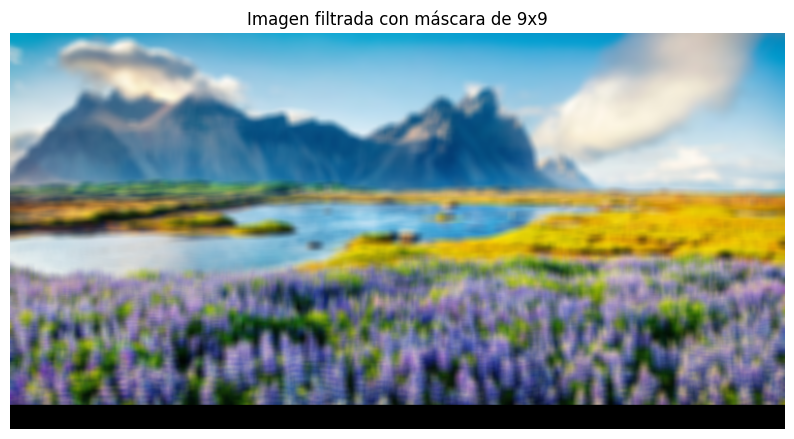

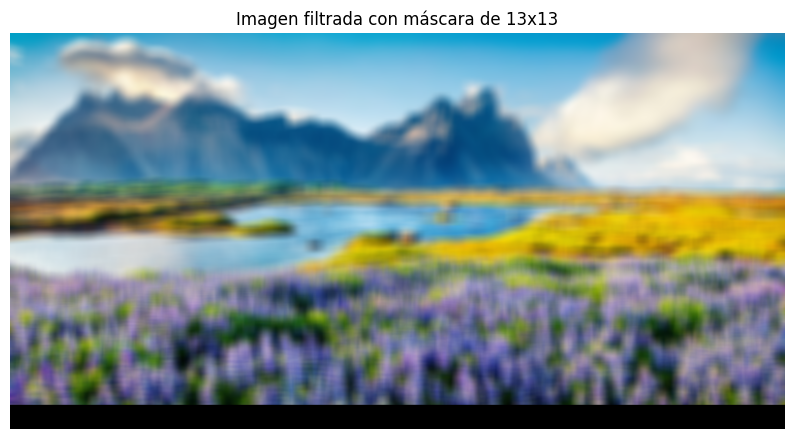

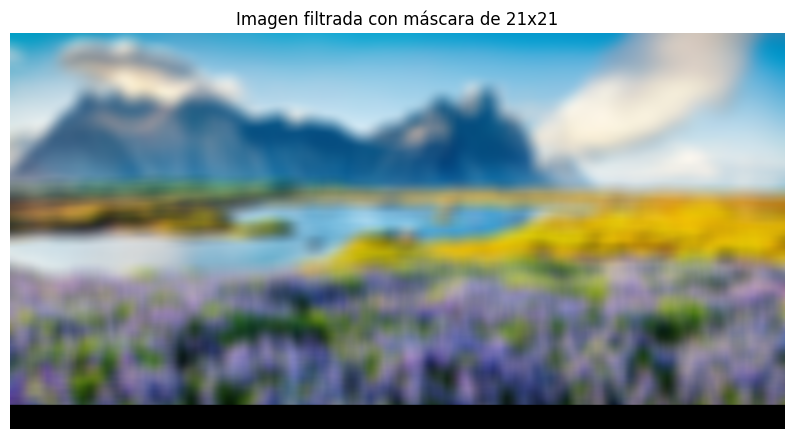

In [12]:
# Definir los tamaños de las máscaras
tamaños_máscara = [9, 13, 21]
# Convertir la imagen a una matriz NumPy
imagen_np = np.array(img_url)
# Aplicar el filtro de Gauss con cada tamaño de máscara
for tamaño in tamaños_máscara:
    # Crear el filtro de Gauss
    start_time = time.time()  # Iniciar el cronómetro antes de la operación
    filtro = filtro_gaussiano(tamaño, 8)  # Puedes ajustar sigma a tus necesidades
    # Aplicar el filtro a la imagen
    imagen_filtrada = aplicar_filtro_pycuda(imagen_np, filtro)
    end_time = time.time()  # Detener el cronómetro después de la operación
    tiempo_ejecucion = end_time - start_time  # Calcular el tiempo de ejecución
    
    print(f"El tiempo de ejecución GAUSS GPU {tamaño}x{tamaño} es: {tiempo_ejecucion} segundos")
    # Mostrar la imagen filtrada
    plt.figure(figsize=(10,10))
    plt.imshow(imagen_filtrada, cmap='gray')
    plt.title(f'Imagen filtrada con máscara de {tamaño}x{tamaño}')
    plt.axis('off')  # no mostrar los ejes
    
plt.show()


### 3.3.1 Guarda la imagen

In [42]:
# Convertir la imagen a una matriz NumPy
imagen_np = np.array(img_url)
# Definir los tamaños de las máscaras
tamaños_máscara = [9, 13, 21]
# Aplicar el filtro de Gauss con cada tamaño de máscara
for tamaño in tamaños_máscara:
    # Crear el filtro de Gauss
    filtro = filtro_gaussiano(tamaño, 8)  # Puedes ajustar sigma a tus necesidades
    # Aplicar el filtro a la imagen
    imagen_filtrada = aplicar_filtro_pycuda(imagen_np, filtro)
    # Guardar la imagen filtrada
    imagen_guardar = Image.fromarray(imagen_filtrada.astype(np.uint8))
    imagen_guardar.save(f"imagen_filtrada_GAUSS_GPU{tamaño}x{tamaño}.jpg")
    print(f"Imagen filtrada de tamaño {tamaño}x{tamaño} guardada.")
print("Todas las imágenes han sido guardadas.")

Imagen filtrada de tamaño 9x9 guardada.
Imagen filtrada de tamaño 13x13 guardada.
Imagen filtrada de tamaño 21x21 guardada.
Todas las imágenes han sido guardadas.


## 3.4. Filtro Sal y Pimienta PyCuda

La función `ruido_sal_pimienta_pycuda` toma como entrada una imagen, una probabilidad y un tamaño de región, y devuelve una nueva imagen que es el resultado de añadir ruido de "sal y pimienta" a regiones específicas de la imagen original utilizando la GPU.

La función se puede describir con los siguientes pasos:

1. **Obtención de las dimensiones de la imagen**: Se obtienen las dimensiones de la imagen original (alto, ancho y número de canales).

2. **Copia de la imagen original**: Se crea una copia de la imagen original para no modificarla.

3. **Definición del kernel de CUDA**: Se define un kernel de CUDA que aplica el ruido de "sal y pimienta" a la imagen. El kernel se ejecuta en la GPU y procesa los píxeles de la imagen en paralelo. Para cada píxel, se calcula el nuevo valor como:

    - Si un número aleatorio `r` es menor que la probabilidad `prob`, entonces se añade ruido al píxel. Si `r` es menor que `prob/2`, se añade ruido de "sal" (se asigna el valor máximo de un píxel, 255). De lo contrario, se añade ruido de "pimienta" (se asigna el valor mínimo de un píxel, 0).
    - Si `r` es mayor o igual que `prob`, entonces se mantiene el valor original del píxel.

4. **Preparación de los datos para la GPU**: Se generan los números aleatorios en Python y se convierten la imagen y los números aleatorios a matrices de un solo canal.

5. **Ejecución del kernel de CUDA**: Se ejecuta el kernel de CUDA en la GPU, pasando las matrices de la imagen, los números aleatorios y la matriz de destino.

6. **Recuperación de los resultados de la GPU**: Se recupera la matriz de destino de la GPU y se le da la forma original de la imagen.




In [44]:
def ruido_sal_pimienta_pycuda(imagen, prob, tamaño_region):
    alto, ancho, canales = imagen.shape

    # Crear la matriz de destino
    dest = np.zeros_like(imagen)

    # Definir el kernel de CUDA
    mod = SourceModule("""
    __global__ void ruido_sal_pimienta(float *dest, float *img, float *ruido, float prob, int ancho, int alto, int canales, int tamaño_region)
    {
        int idx = blockIdx.x * blockDim.x + threadIdx.x;
        int idy = blockIdx.y * blockDim.y + threadIdx.y;
        if (idx >= ancho || idy >= alto) return;
        for (int c = 0; c < canales; c++) {
            for (int i = idx; i < min(idx + tamaño_region, ancho); i++) {
                for (int j = idy; j < min(idy + tamaño_region, alto); j++) {
                    float r = ruido[(j*ancho + i)*canales + c];
                    if (r < prob) {
                        dest[(j*ancho + i)*canales + c] = (r < prob/2) ? 0 : 255;
                    } else {
                        dest[(j*ancho + i)*canales + c] = img[(j*ancho + i)*canales + c];
                    }
                }
            }
        }
    }
    """)

    # Obtener la función del kernel de CUDA
    ruido_sal_pimienta = mod.get_function("ruido_sal_pimienta")

    # Generar los números aleatorios en Python
    ruido = np.random.rand(alto, ancho, canales).astype(np.float32)

    # Convertir la imagen a una matriz de un solo canal
    imagen_1c = np.float32(imagen.flatten())
    ruido_1c = ruido.flatten()

    # Crear la matriz de destino
    dest = np.zeros_like(imagen_1c)

    # Aplicar el ruido de sal y pimienta con CUDA
    ruido_sal_pimienta(drv.Out(dest), drv.In(imagen_1c), drv.In(ruido_1c), np.float32(prob), np.int32(ancho), np.int32(alto), np.int32(canales), np.int32(tamaño_region), block=(32, 32, 1), grid=(ancho//32, alto//32))

    # Reshape la matriz de destino a la forma original de la imagen
    nueva_imagen = np.reshape(np.uint8(dest), (alto, ancho, canales))

    return nueva_imagen


### Resultados

El tiempo de ejecución para una región de tamaño 9x9 es: 0.03360319137573242 segundos
El tiempo de ejecución para una región de tamaño 13x13 es: 0.04091978073120117 segundos
El tiempo de ejecución para una región de tamaño 21x21 es: 0.05281949043273926 segundos


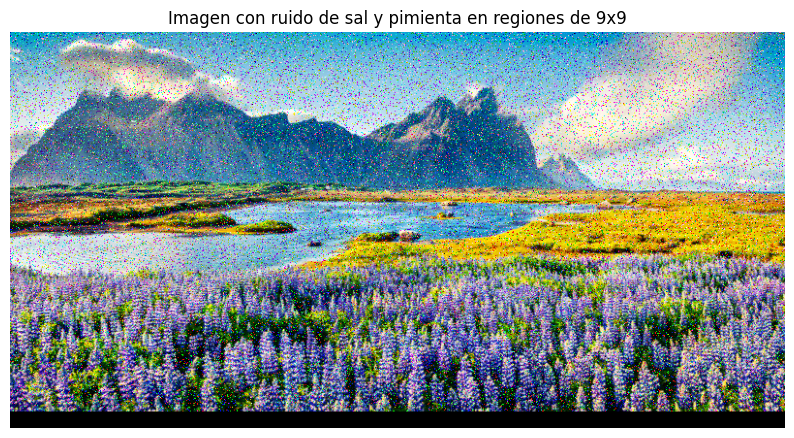

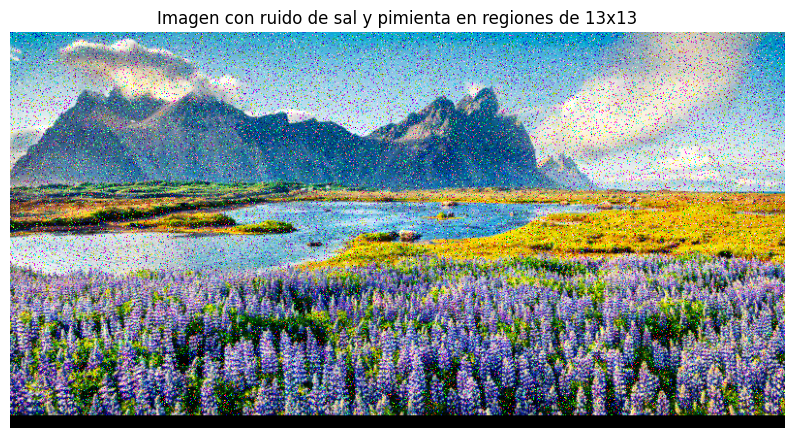

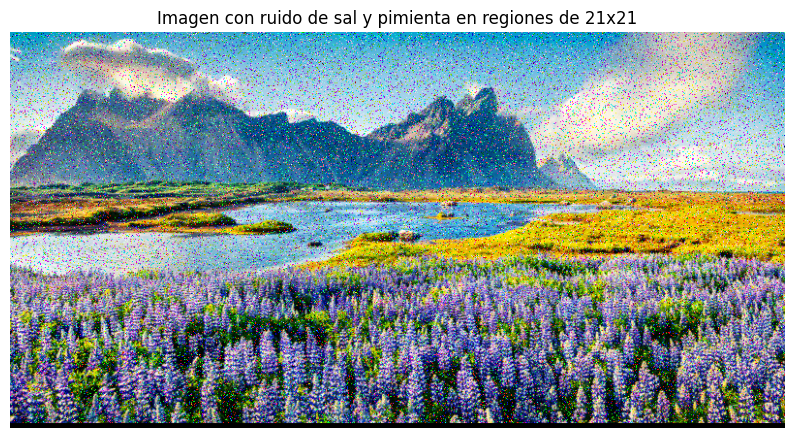

In [38]:
tamaños_región = [9, 13, 21]  # Puedes ajustar los tamaños de las regiones a tus necesidades
prob = 0.1  # Puedes ajustar la probabilidad a tus necesidades

for tamaño in tamaños_región:
    start_time = time.time()  # Iniciar el cronómetro antes de la operación
    
    imagen_ruidosa = ruido_sal_pimienta_pycuda(imagen_np, prob, tamaño)
    
    end_time = time.time()  # Detener el cronómetro después de la operación
    tiempo_ejecucion = end_time - start_time  # Calcular el tiempo de ejecución
    
    print(f"El tiempo de ejecución para una región de tamaño {tamaño}x{tamaño} es: {tiempo_ejecucion} segundos")
    
    # Preparar la imagen ruidosa para mostrar
    plt.figure(figsize=(10,10))
    plt.imshow(imagen_ruidosa, cmap='gray')
    plt.title(f'Imagen con ruido de sal y pimienta en regiones de {tamaño}x{tamaño}')
    plt.axis('off')  # no mostrar los ejes

# Mostrar todas las imágenes al final
plt.show()


### 3.4.1. Guarda la imagen

In [45]:
tamaños_región = [9, 13, 21]  # Puedes ajustar los tamaños de las regiones a tus necesidades
prob = 0.1  # Puedes ajustar la probabilidad a tus necesidades

for tamaño in tamaños_región:
    
    imagen_ruidosa = ruido_sal_pimienta_pycuda(imagen_np, prob, tamaño)
    imagen_guardar = Image.fromarray(imagen_ruidosa.astype(np.uint8))
    imagen_guardar.save(f"imagen_filtrada_SALPIMIETA_GPU{tamaño}x{tamaño}.jpg")
    print(f"Imagen filtrada de tamaño {tamaño}x{tamaño} guardada.")
print("Todas las imágenes han sido guardadas.")
    
    


Imagen filtrada de tamaño 9x9 guardada.
Imagen filtrada de tamaño 13x13 guardada.
Imagen filtrada de tamaño 21x21 guardada.
Todas las imágenes han sido guardadas.


## 3.5. Filtro Sobel 

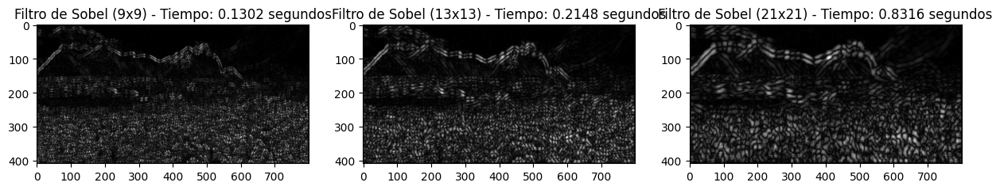

In [6]:
import numpy as np
from scipy.signal import convolve2d
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import time

def sobel_filter(image, kernel_size):
    # Generar los kernels de Sobel dinámicamente según el tamaño especificado
    kernel_x = np.zeros((kernel_size, kernel_size))
    kernel_y = np.zeros((kernel_size, kernel_size))

    mid = kernel_size // 2
    for i in range(kernel_size):
        for j in range(kernel_size):
            if i == mid:
                kernel_x[i, j] = (j - mid) * (i - mid - 1)
                kernel_y[i, j] = (j - mid - 1) * (i - mid)
            else:
                kernel_x[i, j] = (j - mid) * (i - mid)
                kernel_y[i, j] = (j - mid) * (i - mid)

    # Normalizar los kernels
    kernel_x /= np.sum(np.abs(kernel_x))
    kernel_y /= np.sum(np.abs(kernel_y))

    # Aplicar la convolución con los kernels de Sobel
    start_time = time.time()
    gradient_x = convolve2d(image, kernel_x, mode='same', boundary='symm')
    gradient_y = convolve2d(image, kernel_y, mode='same', boundary='symm')
    end_time = time.time()

    # Calcular el gradiente total
    gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)

    return gradient_magnitude, end_time - start_time

# Cargar la imagen
image_path = "C:/Users/lcres/PycharmProjects/computo paralelo/imagen_original.jpg"
image = mpimg.imread(image_path)

# Convertir la imagen a escala de grises si es a color
if len(image.shape) > 2:
    image = np.mean(image, axis=2)

# Especificar los tamaños de kernel deseados
kernel_sizes = [9, 13, 21]

# Calcular y mostrar los bordes para cada tamaño de kernel
plt.figure(figsize=(15, 15))
for i, kernel_size in enumerate(kernel_sizes):
    edges, exec_time = sobel_filter(image, kernel_size)
    plt.subplot(1, len(kernel_sizes), i+1)
    plt.imshow(edges, cmap='gray')
    plt.title(f'Filtro de Sobel ({kernel_size}x{kernel_size}) - Tiempo: {exec_time:.4f} segundos')
    plt.savefig(f'sobel_cpu_{kernel_size}.png')  # Guardar la imagen actual

plt.show()


## 3.6. Filtro Sobel PyCuda

Tiempo de ejecución para el filtro 9x9: 0.0050 segundos
Tiempo de ejecución para el filtro 13x13: 0.0060 segundos
Tiempo de ejecución para el filtro 21x21: 0.0072 segundos


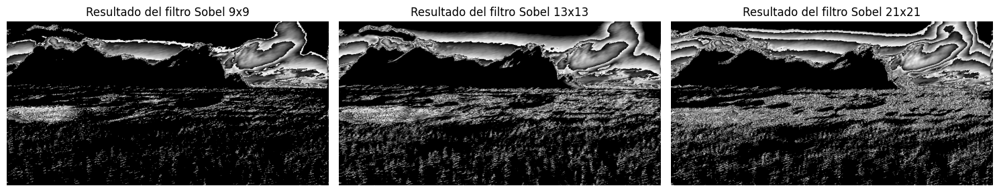

In [8]:
import numpy as np
import pycuda.autoinit
import pycuda.driver as cuda
from pycuda.compiler import SourceModule
import time
import cv2
import matplotlib.pyplot as plt

# Kernel Sobel
sobel_kernel = """
// Define las matrices de convolución
__constant__ int sobel_filter_x[3][3] = { {-1, 0, 1}, {-2, 0, 2}, {-1, 0, 1} };
__constant__ int sobel_filter_y[3][3] = { {-1, -2, -1}, {0, 0, 0}, {1, 2, 1} };

__device__ unsigned char get_pixel_value(const unsigned char* image_data, int width, int height, int x, int y, int channel) {
    x = min(max(x, 0), width - 1);
    y = min(max(y, 0), height - 1);
    return image_data[(y * width + x) * channel + channel];
}

__global__ void sobel_filter_kernel(const unsigned char* image_data, int width, int height, int channels, unsigned char* output_image_data, int filter_size, int threshold) {
    int x = blockIdx.x * blockDim.x + threadIdx.x;
    int y = blockIdx.y * blockDim.y + threadIdx.y;

    if (x < width && y < height) {
        for (int c = 0; c < channels; ++c) {
            int gx = 0;
            int gy = 0;
            for (int i = 0; i < filter_size; ++i) {
                for (int j = 0; j < filter_size; ++j) {
                    gx += sobel_filter_x[i][j] * get_pixel_value(image_data, width, height, x - filter_size / 2 + j, y - filter_size / 2 + i, channels);
                    gy += sobel_filter_y[i][j] * get_pixel_value(image_data, width, height, x - filter_size / 2 + j, y - filter_size / 2 + i, channels);
                }
            }
            int gradient_magnitude = sqrtf(gx * gx + gy * gy);
            output_image_data[(y * width + x) * channels + c] = (gradient_magnitude > threshold) ? gradient_magnitude : 0;
        }
    }
}
"""

def apply_sobel_filter_GPU_with_variable_threshold(image_data, width, height, channels, filter_size, thresholds):
    mod = SourceModule(sobel_kernel)

    sobel_filter_kernel = mod.get_function("sobel_filter_kernel")

    d_image_data = cuda.mem_alloc(image_data.nbytes)
    cuda.memcpy_htod(d_image_data, image_data)

    block_size = (16, 16, 1)
    grid_size = ((width + block_size[0] - 1) // block_size[0], (height + block_size[1] - 1) // block_size[1])

    output_image_data = cuda.mem_alloc(image_data.nbytes)

    sobel_filter_kernel(d_image_data, np.int32(width), np.int32(height), np.int32(channels), output_image_data, np.int32(filter_size), np.int32(thresholds[filter_size]),
                        block=block_size, grid=grid_size)

    output_host = np.empty_like(image_data)
    cuda.memcpy_dtoh(output_host, output_image_data)

    return output_host

# Cargar la imagen
image = cv2.imread("C:/Users/lcres/PycharmProjects/computo paralelo/imagen_original.jpg")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Definir umbrales para cada tamaño de filtro
thresholds = {9: 1500, 13: 1300, 21: 1700}

# Aplicar el filtro Sobel con los tres tamaños de matrices y umbrales variables
filter_sizes = [9, 13, 21]

# Configurar el diseño de subplots
plt.figure(figsize=(15, 5))

for i, size in enumerate(filter_sizes, start=1):
    start_time = time.time() # Registro de tiempo inicial
    # Aplicar el filtro Sobel
    filtered_image = apply_sobel_filter_GPU_with_variable_threshold(gray_image, gray_image.shape[1], gray_image.shape[0], 1, size, thresholds)
    end_time = time.time() # Registro de tiempo final

    # Calcular el tiempo de ejecución
    execution_time = end_time - start_time

    print(f"Tiempo de ejecución para el filtro {size}x{size}: {execution_time:.4f} segundos")

    # Mostrar la imagen en la celda correspondiente del diseño de subplots
    plt.subplot(1, len(filter_sizes), i)
    plt.imshow(filtered_image, cmap='gray')
    plt.title(f"Resultado del filtro Sobel {size}x{size}")
    plt.axis('off')

    # Guardar la imagen actual
    plt.savefig(f'sobel_gpu_{size}.png')

plt.tight_layout()
plt.show()

# 4. Visualización del Tiempo de Ejecion de GPU y CPU

## 4.1. Grafica de barras

In [1]:
import plotly.graph_objects as go

# Tus listas de tiempos de ejecución
tiempos_cpuGAUSS = [51.17216372489929, 105.58489155769348, 262.29653334617615]
tiempos_gpuGAUSS = [0.06250381469726562, 0.015635967254638672, 0.03148460388183594]

tiempos_cpuRUIDO = [0.2408766746520996, 0.1304159164428711, 0.07002115249633789]
tiempos_gpuRUIDO = [0.03360319137573242,0.04091978073120117 , 0.05281949043273926]

tiempos_cpuSOBEL = [1.4463,2.2912 ,3.0199]
tiempos_gpuSOBEL = [0.0034 ,0.0083 ,0.0057 ]

fig = go.Figure(data=[
    go.Bar(name='CPU GAUSS', y=['GAUSS 9x9', 'GAUSS 13x13', 'GAUSS 21x21'], x=tiempos_cpuGAUSS, orientation='h'),
    go.Bar(name='GPU GAUSS', y=['GAUSS 9x9', 'GAUSS 13x13', 'GAUSS 21x21'], x=tiempos_gpuGAUSS, orientation='h'),
    go.Bar(name='CPU SAL/PIMIENTA', y=['SAL/PIMIENTA 9x9', 'SAL/PIMIENTA 13x13', 'SAL/PIMIENTA 21x21'], x=tiempos_cpuRUIDO, orientation='h'),
    go.Bar(name='GPU SAL/PIMIENTA', y=['SAL/PIMIENTA 9x9', 'SAL/PIMIENTA 13x13', 'SAL/PIMIENTA 21x21'], x=tiempos_gpuRUIDO, orientation='h'),
    go.Bar(name='CPU SOBEL', y=['SOBEL 9x9', 'SOBEL 13x13', 'SOBEL 21x21'], x=tiempos_cpuSOBEL, orientation='h'),
    go.Bar(name='GPU SOBEL', y=['SOBEL 9x9', 'SOBEL 13x13', 'SOBEL 21x21'], x=tiempos_gpuSOBEL, orientation='h'),
])

# Cambiar el modo de barra
fig.update_layout(barmode='group')

fig.show()


## 4.2. Tabla

In [10]:
import pandas as pd
import plotly.graph_objects as go

# Suponiendo que tienes los siguientes datos
datos = {
    "Sal/Pimienta-CPU": [0.2408766746520996, 0.1304159164428711, 0.07002115249633789],
    "Sal/Pimienta-GPU": [0.03360319137573242, 0.04091978073120117, 0.05281949043273926],
    "Gauss-CPU": [51.17216372489929, 105.58489155769348, 262.29653334617615],
    "Gauss-GPU": [0.06250381469726562, 0.015635967254638672, 0.03148460388183594],
    "Sobel CPU": [1.4463, 2.2912, 3.0199 ],
    "Sobel GPU": [0.0034 , 0.0083, 0.0057]
}

# Crear un DataFrame de pandas
df = pd.DataFrame(datos, index=["9x9", "13x13", "21x21"])

# Crear una tabla con plotly
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df.columns),
                fill_color='white',
                align='left',
                font=dict(color='black')),
    
    cells=dict(values=[df[col] for col in df.columns],
               fill_color=[['rgba(255, 255, 255, 0.8)', 'rgba(255, 255, 255, 0.8)', 'rgba(255, 255, 255, 0.8)'],  # Color de las celdas de Sal/Pimienta
                           ['rgba(255, 255, 255, 0.8)', 'rgba(255, 255, 255, 0.8)', 'rgba(255, 255, 255, 0.8)'],  # Color de las celdas de Sal/Pimienta
                           ['rgba(200, 200, 200, 0.8)', 'rgba(200, 200, 200, 0.8)', 'rgba(200, 200, 200, 0.8)'],  # Color de las celdas de Gauss
                           ['rgba(200, 200, 200, 0.8)', 'rgba(200, 200, 200, 0.8)', 'rgba(200, 200, 200, 0.8)'],  # Color de las celdas de Gauss
                           ['rgba(150, 150, 150, 0.8)', 'rgba(150, 150, 150, 0.8)', 'rgba(150, 150, 150, 0.8)'],  # Color de las celdas de Sobel
                           ['rgba(150, 150, 150, 0.8)', 'rgba(150, 150, 150, 0.8)', 'rgba(150, 150, 150, 0.8)']],  # Color de las celdas de Sobel
               align='left',font=dict(color='black')))
])

fig.show()


## 4.3. CÁLCULO DEL ACELERAMIENTO

|  | SOBEL| GAUSS | Sal/Pimienta
|---|---|---|---|
| 9X9 | 425.3823|818.75456|7.169642
| 13X13 | 276.0481 |  6,768.256410|3.1882
| 21X21| 529.8070 |8,326.8730|1.325758


# 5. Diferencia entre imagenes de CPU y GPU

El código realiza los siguientes pasos:

1. **Lectura de las imágenes**: Se leen las imágenes filtradas que fueron procesadas por la CPU y la GPU respectivamente.

2. **Conversión de las imágenes a matrices NumPy**: Las imágenes se convierten a matrices NumPy para facilitar el cálculo del MSE.

3. **Cálculo del MSE para cada canal de color**: Se calcula el MSE entre las dos imágenes para cada canal de color (rojo, verde y azul). El MSE es una medida de la diferencia entre dos imágenes. Se calcula como el promedio de los cuadrados de las diferencias de intensidad de los píxeles correspondientes en las dos imágenes.

4. **Cálculo del MSE promedio**: Se calcula el MSE promedio de los tres canales de color.

5. **Cálculo del porcentaje de error**: Se calcula el porcentaje de error entre las dos imágenes. Este porcentaje se calcula como el MSE promedio dividido por el error máximo posible (que es 3 * 255 * 255 para una imagen a color de 8 bits) y multiplicado por 100.



La fórmula para calcular el MSE es:

$$ \text{MSE} = \frac{1}{n} \sum_{i=1}^{n} (Y_i - \hat{Y_i})^2 $$

Donde:
- $Y_i$ es el valor real del píxel.
- $\hat{Y_i}$ es el valor del píxel obtenido por el filtro.
- $n$ es el número total de píxeles.

La fórmula para calcular el porcentaje de error es:

$$ \text{Porcentaje de error} = \left( \frac{\text{MSE promedio}}{\text{Error máximo posible}} \right) \times 100 $$


## 5.1. GAUSS 9X9

In [59]:
import numpy as np
from skimage.metrics import mean_squared_error
from PIL import Image

# Leer las imágenes filtradas en CPU y GPU
imagen_filtrada_cpu = Image.open('C:/Users/lcres/PycharmProjects/computo paralelo/IMAGENES GAUSS CPU/imagen_filtrada_9x9.jpg')
imagen_filtrada_gpu = Image.open('C:/Users/lcres/PycharmProjects/computo paralelo/IMAGENES GAUSS GPU/imagen_filtrada_9x9.jpg')

# Convertir las imágenes a matrices NumPy
imagen_filtrada_cpu_np = np.array(imagen_filtrada_cpu)
imagen_filtrada_gpu_np = np.array(imagen_filtrada_gpu)

# Calcular el Error Cuadrático Medio (MSE) para cada canal de color
mse_r = mean_squared_error(imagen_filtrada_cpu_np[:,:,0], imagen_filtrada_gpu_np[:,:,0])
mse_g = mean_squared_error(imagen_filtrada_cpu_np[:,:,1], imagen_filtrada_gpu_np[:,:,1])
mse_b = mean_squared_error(imagen_filtrada_cpu_np[:,:,2], imagen_filtrada_gpu_np[:,:,2])

# Calcular el MSE promedio
mse_promedio = (mse_r + mse_g + mse_b) / 3

print("Error Cuadrático Medio (MSE) para el canal rojo:", mse_r)
print("Error Cuadrático Medio (MSE) para el canal verde:", mse_g)
print("Error Cuadrático Medio (MSE) para el canal azul:", mse_b)
print("Error Cuadrático Medio (MSE) promedio:", mse_promedio)

# Calcular el porcentaje de error
max_error = 3 * 255 * 255  # El error máximo posible para una imagen a color de 8 bits
porcentaje_error = (mse_promedio / max_error) * 100

print(f"El porcentaje de error entre las imágenes es: {porcentaje_error}%")


Error Cuadrático Medio (MSE) para el canal rojo: 552.3168643031785
Error Cuadrático Medio (MSE) para el canal verde: 856.475
Error Cuadrático Medio (MSE) para el canal azul: 1097.1930592909534
Error Cuadrático Medio (MSE) promedio: 835.3283078647106
El porcentaje de error entre las imágenes es: 0.42820879552208674%


Los resultados muestran que el MSE para el canal rojo es 552.32, para el canal verde es 856.48, y para el canal azul es 1097.19. El MSE promedio es 835.33, lo que representa un porcentaje de error del 0.43% entre las dos imágenes.

## 5.2. SAL PIMIENTA 9X9

In [11]:
import numpy as np
from skimage.metrics import mean_squared_error
from PIL import Image

# Leer las imágenes filtradas en CPU y GPU
imagen_filtrada_cpu = Image.open('C:/Users/lcres/PycharmProjects/computo paralelo/IMAGENES SAL_PIMIENTA CPU/imagen_filtrada_SALPIMIETA_CPU9x9.jpg')
imagen_filtrada_gpu = Image.open('C:/Users/lcres/PycharmProjects/computo paralelo/IMAGENES SAL_PIMIENTA GPU/imagen_filtrada_SALPIMIETA_GPU9x9.jpg')

# Convertir las imágenes a matrices NumPy
imagen_filtrada_cpu_np = np.array(imagen_filtrada_cpu)
imagen_filtrada_gpu_np = np.array(imagen_filtrada_gpu)

# Calcular el Error Cuadrático Medio (MSE) para cada canal de color
mse_r = mean_squared_error(imagen_filtrada_cpu_np[:,:,0], imagen_filtrada_gpu_np[:,:,0])
mse_g = mean_squared_error(imagen_filtrada_cpu_np[:,:,1], imagen_filtrada_gpu_np[:,:,1])
mse_b = mean_squared_error(imagen_filtrada_cpu_np[:,:,2], imagen_filtrada_gpu_np[:,:,2])

# Calcular el MSE promedio
mse_promedio = (mse_r + mse_g + mse_b) / 3

print("Error Cuadrático Medio (MSE) para el canal rojo:", mse_r)
print("Error Cuadrático Medio (MSE) para el canal verde:", mse_g)
print("Error Cuadrático Medio (MSE) para el canal azul:", mse_b)
print("Error Cuadrático Medio (MSE) promedio:", mse_promedio)

# Calcular el porcentaje de error
max_error = 3 * 255 * 255  # El error máximo posible para una imagen a color de 8 bits
porcentaje_error = (mse_promedio / max_error) * 100

print(f"El porcentaje de error entre las imágenes es: {porcentaje_error}%")


Error Cuadrático Medio (MSE) para el canal rojo: 3895.382319682152
Error Cuadrático Medio (MSE) para el canal verde: 4056.298511613692
Error Cuadrático Medio (MSE) para el canal azul: 3205.3620507334963
Error Cuadrático Medio (MSE) promedio: 3719.01429400978
El porcentaje de error entre las imágenes es: 1.9064535660693476%


Los resultados muestran que el MSE para el canal rojo es 3895.382319682152, para el canal verde es 4056.298511613692, y para el canal azul es 3205.3620507334963. El MSE promedio es 3719.01429400978, lo que representa un porcentaje de error del 1.9064535660693476% entre las dos imágenes.

## 5.3. SOBEL 9X9

In [1]:
import numpy as np
from skimage.metrics import mean_squared_error
from PIL import Image

# Leer las imágenes filtradas en CPU y GPU
imagen_filtrada_cpu = Image.open('sobel_cpu_9.png')
imagen_filtrada_gpu = Image.open('sobel_gpu_9.png')

# Redimensionar las imágenes si tienen diferentes dimensiones
if imagen_filtrada_cpu.size != imagen_filtrada_gpu.size:
    imagen_filtrada_cpu = imagen_filtrada_cpu.resize(imagen_filtrada_gpu.size)

# Convertir las imágenes a matrices NumPy
imagen_filtrada_cpu_np = np.array(imagen_filtrada_cpu)
imagen_filtrada_gpu_np = np.array(imagen_filtrada_gpu)

# Calcular el Error Cuadrático Medio (MSE) para cada canal de color
mse_r = mean_squared_error(imagen_filtrada_cpu_np[:,:,0], imagen_filtrada_gpu_np[:,:,0])
mse_g = mean_squared_error(imagen_filtrada_cpu_np[:,:,1], imagen_filtrada_gpu_np[:,:,1])
mse_b = mean_squared_error(imagen_filtrada_cpu_np[:,:,2], imagen_filtrada_gpu_np[:,:,2])

# Calcular el MSE promedio
mse_promedio = (mse_r + mse_g + mse_b) / 3

print("Error Cuadrático Medio (MSE) para el canal rojo:", mse_r)
print("Error Cuadrático Medio (MSE) para el canal verde:", mse_g)
print("Error Cuadrático Medio (MSE) para el canal azul:", mse_b)
print("Error Cuadrático Medio (MSE) promedio:", mse_promedio)

# Calcular el porcentaje de error
max_error = 3 * 255 * 255  # El error máximo posible para una imagen a color de 8 bits
porcentaje_error = (mse_promedio / max_error) * 100

print(f"El porcentaje de error entre las imágenes es: {porcentaje_error}%")


Error Cuadrático Medio (MSE) para el canal rojo: 2973.7802373333334
Error Cuadrático Medio (MSE) para el canal verde: 2973.7802373333334
Error Cuadrático Medio (MSE) para el canal azul: 2973.7802373333334
Error Cuadrático Medio (MSE) promedio: 2973.780237333334
El porcentaje de error entre las imágenes es: 1.5244291874065534%


# 6. Conclusiones

## 6.1. Eficacia de los filtros

Podemos obervar que los filtros se generan correctamente a las imagenes resultante, tambien depende que los parametros que coloquemos mediante el preprocesamiento para asi tener un efecto fuerte o debil del filtro, asi como podemos manipular las probabilidades para obtener más o menos resultados.

## 6.2. Comparacion entre CPU y GPU

Los diferentes metodos para e preprocesamiento de las iamgenes tanto en GPU como en CPU se denoto una diferente notable a la vista del usuario, en donde el tiempo de ejecucion para los tres filtros aplicados se denota una gran diferencia de velocidad, que mientras con CPU demora mucho este proceso.
tambien se nota un comportamiento en la calidad de las imagenes, podemos observar que con GPU se ve mas limpia y mas delicada.

## 6.3. Error Cuadratico Medio (MSE)

Podemos observar los resultados presenta una notable diferencia entre las iamgenes, ya que un MSE mayor a 1 quiere decir que las iamgenes que se estan comparando tiene una diferente significante una frente a la otra, y tambien podemos verla visualmente en lso resultados en donde aplicar os filtros con GPU mejorar el procesamiento de las imagenes, sacando como resultado imagenes de buena calidad, tal como CPU con puede hacerlo.

# 7. Referencias

1. GeeksforGeeks. (n.d.). Gaussian Filter Generation in C/C++. Recuperado de https://www.geeksforgeeks.org/gaussian-filter-generation-c/
2. Klöckner, A. (2024). PyCUDA 2024.1 documentation. Recuperado de https://documen.tician.de/pycuda/